# Make and Inspect Lightcurves from TESS FFIs

In this notebook you will find an example for how to download a TESS FFI cutout centered on a target using TESScut and a subsequent photometric analysis. In the example, we are looking at a star in the crowded open cluster NGC 3532 whose lightcurve is showing the signal from a nearby star. This demonstrates the source confusion problem that often arises in crowded open clusters.

## Set up Notebook

**Imports**

In [1]:
import warnings
warnings.filterwarnings('ignore')


# Plotting program
import matplotlib.pyplot as plt

# System
import os
import sys
from glob import glob

# Good for reading/writing data tables
import pandas as pd

# Better math, numbers, and array functions
import numpy as np

# Astropy
from astropy.timeseries import LombScargle
from astropy.io import fits, ascii
from astropy.table import Table, join

# Download TESS
from astroquery.mast import Tesscut
from astropy.coordinates import SkyCoord
import astropy.units as units

from astroquery.vizier import Vizier # then we import the Vizier() tool
from astroquery.xmatch import XMatch # ...and the Xmatch() tool

# TESS cpm
import tess_cpm as tess_cpm

Could not import regions, which is required for some of the functionalities of this module.


**Set up directories**

In [2]:
lightcurve_dir = 'Lightcurves/'
ffi_dir = 'FFI_Cutouts/'
dir_catalog = 'Auto_results_2024Jan06.csv'

**Define Functions**

Define a function to check if the TESS FFI cutout for a target has been downloaded. If not, download the 40x40 pixel cutout using TESScut.

In [24]:
def download_tess(target_data, dir_ffi):
    
    # target_data is a table element with data for a target star
    # dir_ffi is the directory where FFI cutouts are saved
    
    # test if files exist
    # if not, download
    files_ffi = glob(dir_ffi+"*"+str(target_data['Gaia_DR3_Source'][0])+"*.fits")
    

    if len(files_ffi) == 0:
        os.mkdir(dir_ffi+str(target_data['Gaia_DR3_Source'][0])+'/')
        cutout_coord = SkyCoord(target_data['RA'][0], target_data['Dec'][0],unit = "deg")      
        manifest = Tesscut.download_cutouts(coordinates=cutout_coord, size=40, path=dir_ffi+
                                            str(target_data['Gaia_DR3_Source'][0])+'/')
        dl_files = glob(dir_ffi+str(target_data['Gaia_DR3_Source'][0])+"/*")
        for d in dl_files:
            sector = d[40:42]
            os.rename(d, dir_ffi+str(target_data['Gaia_DR3_Source'][0])+'-Sector_'+sector+'.fits')
        os.rmdir(dir_ffi+str(target_data['Gaia_DR3_Source'][0])+'/')
        files_ffi = glob(dir_ffi+str(target_data['Gaia_DR3_Source'][0])+"*")
    else:
        downloaded_sectors = []
        for f in files_ffi:
            sector = f[39:41]
            downloaded_sectors.append(int(sector))
        os.mkdir(dir_ffi+str(target_data['Gaia_DR3_Source'][0])+'/')
        cutout_coord = SkyCoord(target_data['RA'][0], target_data['Dec'][0],unit = "deg")
        available_sectors = Tesscut.get_sectors(coordinates=cutout_coord)
        for s in available_sectors['sector']:
            if(not(s in downloaded_sectors)):
                manifest = Tesscut.download_cutouts(coordinates=cutout_coord, size=40, path=dir_ffi+
                                                    str(target_data['Gaia_DR3_Source'][0])+'/', sector=s)
        dl_files = glob(dir_ffi+str(target_data['Gaia_DR3_Source'][0])+"/*")
        for d in dl_files:
            sector = d[40:42]
            os.rename(d, dir_ffi+str(target_data['Gaia_DR3_Source'][0])+'-Sector_'+sector+'.fits')
        os.rmdir(dir_ffi+str(target_data['Gaia_DR3_Source'][0])+'/')
        files_ffi = glob(dir_ffi+str(target_data['Gaia_DR3_Source'][0])+"*")
        
    # Check data sizes
    # delete any small files
    files = glob(dir_ffi+'*')
    for file in files:
        bsize = os.path.getsize(file) #size in bytes
        if (bsize < 200):
            os.remove(file)
            
    return files_ffi


Define functions to extract lightcurves from TESS FFI cutouts using Causal Pixel Modeling procedure as implemented in the **unpopular** package (Hattori, 2022). We are using an earlier version of this package here.

In [5]:
def load_ffi(file):
    ffi_data = fits.open(file)
    images = ffi_data[1].data
    times = images['Time']
    image = images['Flux']
    quality = images['Quality']
    iq = np.where(quality == 0)
    good_times = times[iq[0]]
    good_images = image[iq[0]]
    return good_times, good_images


def cpm_do(file,t_row=20, t_col=20, excl=4):
    cpm = tess_cpm.CPM(file, remove_bad=True)
    cpm.set_target(t_row, t_col)
    cpm.set_exclusion(excl)
    cpm.set_predictor_pixels(256, method='similar_brightness') # cosine_similarity
    cpm.lsq(0.1, rescale=True, polynomials=False)
#    tess_cpm.summary_plot(cpm, 15)
    #aperture_lc, lc_matrix = cpm.get_aperture_lc(box=1, show_pixel_lc=True, show_aperture_lc=True)
    time = cpm.time
    flux = cpm.rescaled_target_fluxes - cpm.lsq_prediction
    return time, flux

def make_cpm(target_data, dir_lightcurve, dir_ffi, excl=4, mad_cut=20):
    files = download_tess(target_data, dir_ffi)

    for f in files:
        csv_file = dir_lightcurve + f[12:41] + '.csv'
        lc_test = glob(csv_file)
        if np.size(lc_test) == 0:
            time, flux = [], []
            lc_table = Table()
            rows = range(18, 23)
            cols = range(18, 23)
            for r in rows:
                for c in cols:
                    flux_name = 'Flux_'+str(r)+'_'+str(c)
                    this_time, this_flux = cpm_do(f,t_row=r,t_col=c,excl=excl)
                    mad = np.nanmedian(np.abs(this_flux*100))
                    if mad < mad_cut:
                        time = this_time
                        flux = this_flux
                    else:
                        time = this_time
                        flux = np.zeros(len(this_flux))
                    lc_table['Time'] = time
                    lc_table[flux_name] = flux
              
            
            ascii.write(lc_table, csv_file, format = 'csv', overwrite = True)
    lc_files = glob(dir_lightcurve+"*"+str(target_data['Gaia_DR3_Source'][0])+"*.csv")
    return lc_files


Define function to measure the period of a signal from a lightcurve using Lomb Scargle periodogram.

In [6]:
def LS_Period(time, flux, pmin=0.1, pmax=30.0):
    fmax = 1/pmin # 0.1 days
    fmin = 1/pmax # 50 days
    freq, power = LombScargle(time, flux).autopower(minimum_frequency=fmin, maximum_frequency=fmax)
    return 1/freq[np.argmax(power)],np.max(power)

Define a function to create a star profile for a target, plotting FFIs from available sectors, creating grids of extracted lightcurves and associated periodograms, and plotting the stellar neighborhood.

In [7]:
def star_profile(star_id, catalog, dir_lightcurve, dir_ffi, ylim, fold_period=-1, Pmin = 0.1, Pmax = 30):
    star = np.where(catalog['Gaia_DR3_Source'] == star_id)[0]
    lc_files = make_cpm(catalog[star], dir_lightcurve, dir_ffi)


    for f in lc_files:
        sector = f[39:41]
        print('Sector ' + str(sector))
        rows = np.arange(20-2,20+3,1)
        cols = np.arange(20-2,20+3,1)
        dir_star = dir_lightcurve + str(star_id) + '-Sector_' + sector + '.csv'

        fig, axis = plt.subplots(5, 5, figsize = (90,30))
        lightcurve = ascii.read(dir_star, format = 'csv')
        for t_row in rows:
            for t_col in cols:
                flux_title = 'Flux_' + str(t_row) + '_' + str(t_col)
                time = lightcurve['Time']
                flux = lightcurve[flux_title]
                if fold_period == -1:
                    axis[t_row-18, t_col-18].scatter(time,flux,s=3, c='blue')
                else:
                    axis[t_row-18, t_col-18].scatter(time % fold_period,flux,s=3)
                axis[t_row-18, t_col-18].set_title(str(t_row)+' '+str(t_col),fontsize=15)
                axis[t_row-18, t_col-18].set_ylim(ylim*-1, ylim)

        plt.show()

    periods_test = np.logspace(np.log10(Pmin),np.log10(Pmax),10000)
    freq_test = 1/periods_test

    fig, axis = plt.subplots(5, 5, figsize = (90,30))
    for t_row in rows:
        for t_col in cols:
            flux_title = 'Flux_' + str(t_row) + '_' + str(t_col)
            time = lightcurve['Time']
            flux = lightcurve[flux_title]
            power_test = LombScargle(time, flux).power(freq_test)
            period = periods_test[np.argmax(power_test)]
            axis[t_row-18, t_col-18].plot(periods_test,power_test)
            axis[t_row-18, t_col-18].set_xscale('log')
            axis[t_row-18, t_col-18].set_title(str(t_row)+' '+str(t_col),fontsize=15)
    plt.show()


    distances = dist_form_arr(catalog['RA'][star],catalog['Dec'][star],catalog['RA'],catalog['Dec'])
    neighbor_index = np.where(distances<120)[0]

    print(catalog[neighbor_index])

    print('Cycle 1')

    plt.scatter((catalog['RA'][neighbor_index] - catalog['RA'][star])*60, (catalog['Dec'][neighbor_index] - catalog['Dec'][star])*60, c = catalog['LS_Period_Cycle1'][neighbor_index], cmap = 'spring')
    plt.colorbar(label = r'TESS $P_{\rm rot}$', orientation = 'vertical')
    plt.xlim((-2,2))
    plt.ylim((-2,2))
    plt.xlabel(r'$\Delta$RA (arcmin)')
    plt.ylabel(r'$\Delta$Dec (arcmin)')
    plt.title(r'$P_{\rm rot}$ of Nearby Stars')
    plt.show()
    print(catalog['LS_Period_Cycle1'][neighbor_index])

    print('Cycle 3')

    plt.scatter((catalog['RA'][neighbor_index] - catalog['RA'][star])*60, (catalog['Dec'][neighbor_index] - catalog['Dec'][star])*60, c = catalog['LS_Period_Cycle3'][neighbor_index], cmap = 'spring')
    plt.colorbar(label = r'TESS $P_{\rm rot}$', orientation = 'vertical')
    plt.xlim((-2,2))
    plt.ylim((-2,2))
    plt.xlabel(r'$\Delta$RA (arcmin)')
    plt.ylabel(r'$\Delta$Dec (arcmin)')
    plt.title(r'$P_{\rm rot}$ of Nearby Stars')
    plt.show()
    print(catalog[neighbor_index]['LS_Period_Cycle3'])
    
    print('Cycle 5')

    plt.scatter((catalog['RA'][neighbor_index] - catalog['RA'][star])*60, (catalog['Dec'][neighbor_index] - catalog['Dec'][star])*60, c = catalog['LS_Period_Cycle5'][neighbor_index], cmap = 'spring')
    plt.colorbar(label = r'TESS $P_{\rm rot}$', orientation = 'vertical')
    plt.xlim((-2,2))
    plt.ylim((-2,2))
    plt.xlabel(r'$\Delta$RA (arcmin)')
    plt.ylabel(r'$\Delta$Dec (arcmin)')
    plt.title(r'$P_{\rm rot}$ of Nearby Stars')
    plt.show()
    print(catalog[neighbor_index]['LS_Period_Cycle5'])
    
    """
  fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(20,5))
  i=0
  for ax in [ax1,ax2,ax3]:
    ffi_image = load_ffi_fromfile(FFI_file[i])
    ffi_renorm = ffi_image-np.min(ffi_image)
    color_map = plt.cm.get_cmap('gray')
    reversed_color_map = color_map.reversed()
    ffi_mod = np.clip(ffi_renorm,0,5000)
    ax.imshow(ffi_mod,origin = 'lower',cmap=reversed_color_map)
    i+=1
  plt.show()
"""


Function to find sky position distances to all other elements in a table.

In [8]:
def dist_form_arr(ra, dec, ra_arr, dec_arr):
  dist =  np.sqrt(np.sum([[np.square(ra_arr - ra)], [np.square(dec_arr - dec)]], axis = 0)[0])*3600
  return dist

**Load cluster catalog**

In [9]:
full_catalog = ascii.read(dir_catalog, format = 'csv')


full_catalog

Gaia_DR3_Source,Gaia_DR2_Source,RA,Dec,Plx,e_Plx,pmRA,pmDE,e_pm,RUWE,Gmag,e_Gmag,bp_rp,e_bp_rp,RV,e_RV,RV_Gaia,e_RV_Gaia,RV_GES,e_RV_GES,RV_Dario,e_RV_Dario,Teff_TIC_model,Teff_Gaia_bprp,Source_Spec,Teff_Spec,logg_Spec,[Fe/H]_Spec,RV_Spec,Li_Spec,Vbroad_Spec,Prot,Prot_TESS,Member_Gaia,Member_CG,Member_Theia,Member_DJF,Member_Hunt,Member_Curtis,Binary_Astrom,Binary_Spec,Binary_Phot,d_Plx,d_pm,d_RV,d_CMD,Done,N_Sectors_Cycle1,N_Sectors_Cycle3,N_Sectors_Cycle5,LS_Power_Cycle1,LS_Period_Cycle1,LS_Power_Cycle1_rapid,LS_Period_Cycle1_rapid,LS_Power_Cycle1_slow,LS_Period_Cycle1_slow,LS_Power_Cycle3,LS_Period_Cycle3,LS_Power_Cycle3_rapid,LS_Period_Cycle3_rapid,LS_Power_Cycle3_slow,LS_Period_Cycle3_slow,LS_Power_Cycle5,LS_Period_Cycle5,LS_Power_Cycle5_rapid,LS_Period_Cycle5_rapid,LS_Power_Cycle5_slow,LS_Period_Cycle5_slow,Possible_Blend_Cycle1,Possible_Blend_Cycle3,Possible_Blend_Cycle5
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str3,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64
5241875613368612864,5241875613368612864,164.62269364708,-61.81945583644,2.1365,0.0237,-10.031,6.2,0.0367967389859482,1.805,13.38852,0.002805,0.963757,0.005140401929810548,nan,nan,5.65,4.13,nan,nan,nan,nan,5468.936970015048,5435.9,...,nan,nan,nan,nan,nan,nan,nan,nan,0,0,1,0,0,0,0,0,0,nan,nan,nan,nan,2,2,1,2,0.2317698057758105,5.6322771267058425,0.02065152517652091,2.972972802877675,0.2317698057758105,5.6322771267058425,0.15027049258278008,5.381001104177192,0.011823093144577348,2.4882229574941666,0.15027049258278008,5.381001104177192,0.18325065411056868,5.217758215543319,0.007605488915075415,2.996812694680618,0.18325065411056868,5.217758215543319,0,0,0
5242166605985236096,5242166605985236096,162.80777072131,-60.81534426769,1.8535,0.0795,-9.411,5.557,0.1380326048439281,0.996,17.599751,0.002984,2.436581,0.0297864225612946,nan,nan,nan,nan,nan,nan,nan,nan,3570.9766137006345,3553.0,...,nan,nan,nan,nan,nan,nan,nan,nan,0,0,1,0,0,0,0,0,0,nan,nan,nan,nan,0,0,0,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0,0,0
5254207563975333888,5254207563975333888,161.15592359814,-60.45828316557,2.3918,0.0943,-11.129,6.626,0.15297058540778355,1.007,17.952528,0.003138,2.616352,0.03583808058476347,nan,nan,nan,nan,nan,nan,nan,nan,3407.9715068309297,3479.4,...,nan,nan,nan,nan,nan,nan,nan,nan,0,0,1,0,0,0,0,0,0,nan,nan,nan,nan,0,0,0,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0,0,0
5334364504244265088,5334364504244265088,171.1654578368,-61.53890036366,1.9586,0.0513,-9.63,3.513,0.07574298647399638,2.795,14.750587,0.002849,1.173842,0.005351989910304391,nan,nan,50.43,14.25,nan,nan,nan,nan,4953.112274174114,5153.0,...,nan,nan,nan,nan,nan,nan,nan,nan,0,0,1,0,0,0,0,0,0,nan,nan,nan,nan,2,2,2,0,0.4835234847673348,0.6108014255776041,0.4835234847673348,0.6108014255776041,0.004361252779182042,7.931238725431774,0.28067995692308595,0.6108014255776041,0.28067995692308595,0.6108014255776041,0.010982037572988948,6.987759182805022,nan,nan,nan,nan,nan,nan,0,0,0
5334411577110134016,5334411577110134016,172.83056655771,-61.4056998483,2.0708,0.0243,-10.55,4.08,0.03606937759374287,0.986,15.414752,0.00278,1.485167,0.005741809209648123,nan,nan,nan,nan,nan,nan,nan,nan,4382.893888601828,4606.0,...,nan,nan,nan,nan,nan,nan,nan,nan,0,0,1,0,0,0,0,0,0,nan,nan,nan,nan,2,2,2,0,0.24020192969231444,27.476787584356142,0.004855396196088211,1.6388067520137959,0.24020192969231444,27.476787584356142,0.026310468185345756,10.10164200735063,0.0025668836281896473,0.135304951280008,0.026310468185345756,10.10164200735063,nan,nan,nan,nan,nan,nan,0,0,0
533

## Examples

Let's start with an example of a star with a a lightcurve showing blending from a neighbor in NGC 3532.

In [10]:
#Find our target using Gaia DR3 ID

star_id = 5340164359375784576

star_index = np.where(full_catalog['Gaia_DR3_Source'] == star_id)[0]

star_index

array([3017])

In [25]:
download_tess(full_catalog[star_index], ffi_dir)

Inflating...


['FFI_Cutouts/5340164359375784576-Sector_63.fits',
 'FFI_Cutouts/5340164359375784576-Sector_64.fits',
 'FFI_Cutouts/5340164359375784576-Sector_11.fits',
 'FFI_Cutouts/5340164359375784576-Sector_10.fits',
 'FFI_Cutouts/5340164359375784576-Sector_37.fits']

In [13]:
make_cpm(full_catalog[star_index], lightcurve_dir, ffi_dir)

['Lightcurves/5340164359375784576-Sector_10.csv',
 'Lightcurves/5340164359375784576-Sector_11.csv',
 'Lightcurves/5340164359375784576-Sector_64.csv',
 'Lightcurves/5340164359375784576-Sector_63.csv',
 'Lightcurves/5340164359375784576-Sector_37.csv']

Sector 10


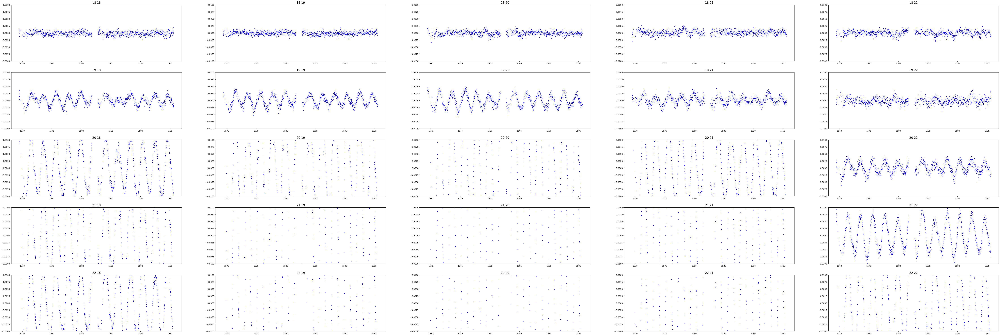

Sector 11


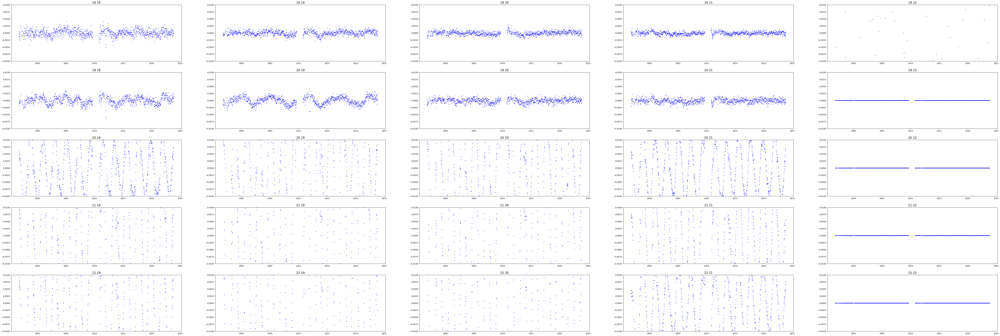

Sector 64


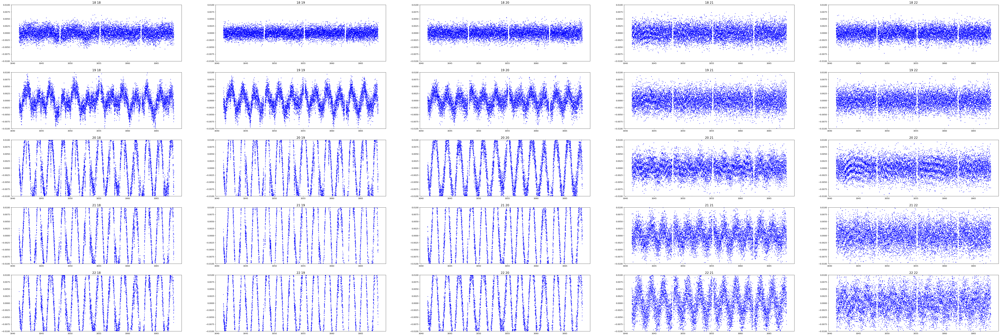

Sector 63


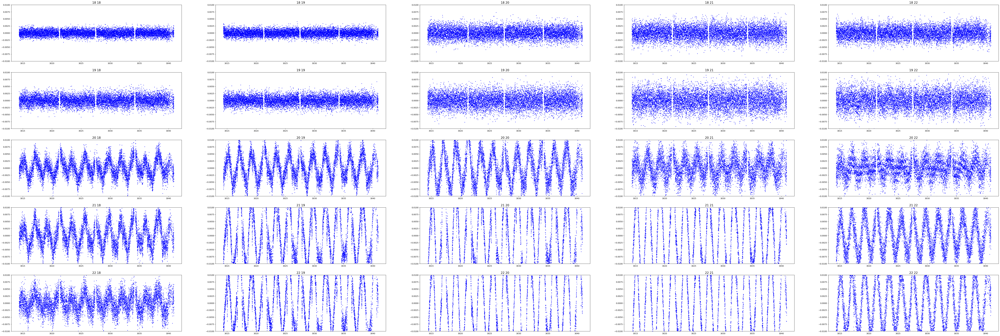

Sector 37


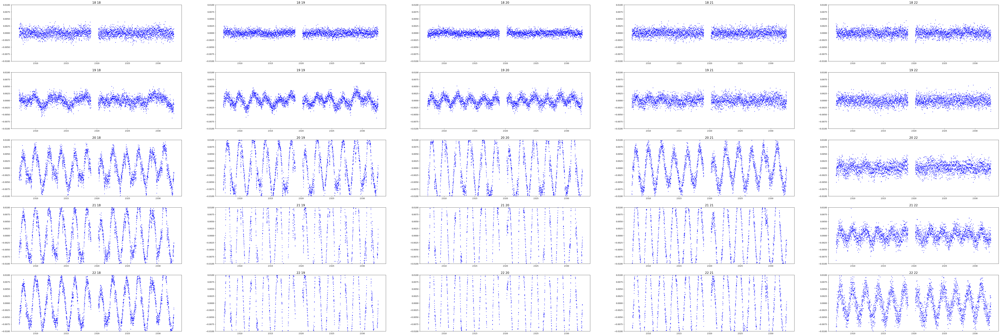

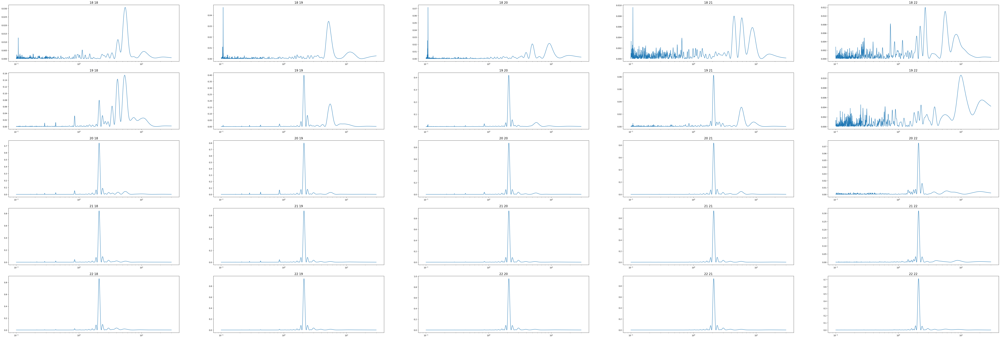

  Gaia_DR3_Source     Gaia_DR2_Source   ... Possible_Blend_Cycle5
------------------- ------------------- ... ---------------------
5340164187577098624 5340164187577098624 ...                     0
5340164251958210560 5340164251958210560 ...                     0
5340164290656319232 5340164290656319232 ...                     0
5340164290656319872 5340164290656319872 ...                     0
5340164359375784576 5340164359375784576 ...                     0
5340164359375788288 5340164359375788288 ...                     0
5340164393735537024 5340164393735537024 ...                     0
5340164702973188864 5340164702973188864 ...                     0
5340164973530899712 5340164973530899712 ...                     0
Cycle 1


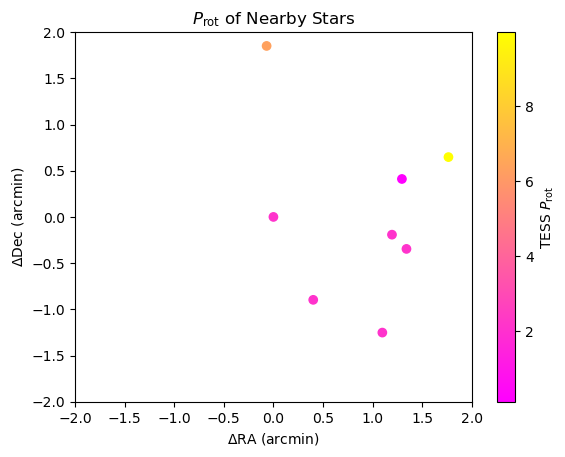

  LS_Period_Cycle1 
-------------------
  2.104007867759358
  2.104007867759358
  2.104007867759358
  2.104007867759358
  2.104007867759358
                nan
0.10782129445457735
  9.987038863875412
  6.349126319940317
Cycle 3


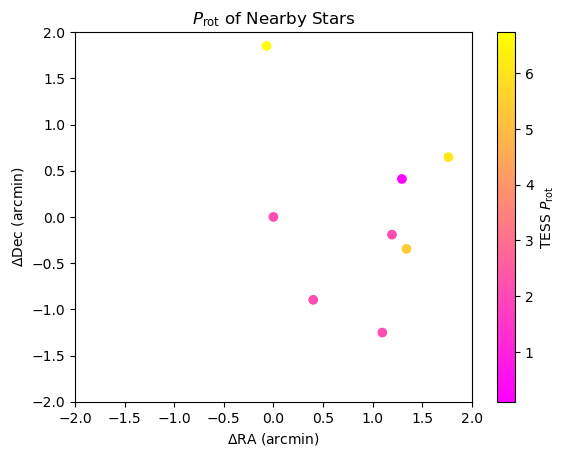

  LS_Period_Cycle3 
-------------------
  2.104007867759358
 2.1016085960171256
 2.1016085960171256
  5.374864965576191
  2.104007867759358
                nan
0.10782129445457735
 6.1075379420716525
  6.737227027428402
Cycle 5


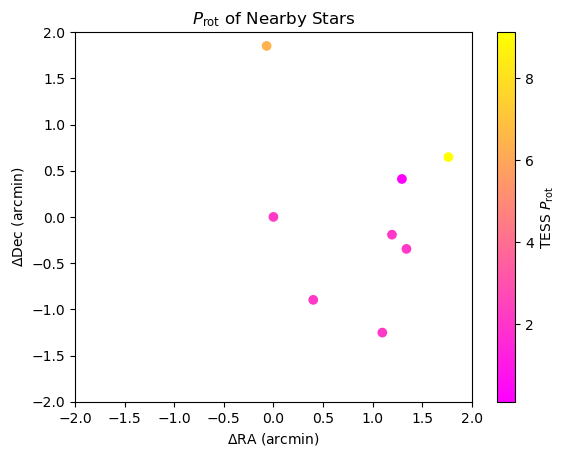

  LS_Period_Cycle5 
-------------------
 2.1088146316548637
  2.106409878596254
  2.104007867759358
  2.104007867759358
  2.106409878596254
                nan
0.10782129445457735
  9.126208673275793
  6.407345672777307


In [18]:
star_profile(5340164359375784576, full_catalog, lightcurve_dir, ffi_dir, 0.01)

Notice the strong ~2.1 day signal contaminating many pixels with high power in each sector. This is a quintessential example of a star with a strong rotational signal contaminating the signals of nearby stars. The rotational analysis we perform for crowded clusters takes cases like these into account by removing rotation periods from our catalog that are measured from light curves that exhibit this blending phenomenon. See crowding_analysis.ipynb for this analysis.